# Notebook with all perrcentiles calculated (Wind and Precipitation, wet-day and all-day and historical and future)

#### PS: Using pcolormesh, with ERA5 on the same domain as the CRCM6 grid, percentile['ERA5', 'pr'] = percentile['ERA5', 'pr'].assign_coords(longitude=(percentile['ERA5', 'pr'].longitude + 360) % 360).sortby('longitude') is needed to remove the visual artefact

In [1]:
import xarray as xr
import numpy as np
import cartopy.crs as ccrs
import cartopy
from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

In [2]:
simulations = ['ERA5', 'UBB', 'UBD', 'UBE', 'UBF', 'UBG', 'UBH', 'UBI']

sim_label = {
    'ERA5': r'ERA5',
    'UBB': r'CRCM6$_{\mathbf{ERA5}}$',
    'UBD': r'CRCM6$_{\mathbf{EC\text{-}Earth3\text{-}Veg}}$',
    'UBG': r'CRCM6$_{\mathbf{EC\text{-}Earth3\text{-}Veg}}$',
    'UBE': r'CRCM6$_{\mathbf{MPI\text{-}ESM1\text{-}2\text{-}HR}}$',
    'UBH': r'CRCM6$_{\mathbf{MPI\text{-}ESM1\text{-}2\text{-}HR}}$',
    'UBF': r'CRCM6$_{\mathbf{MIROC6}}$',
    'UBI': r'CRCM6$_{\mathbf{MIROC6}}$'
}

for_pole = xr.open_mfdataset('/home/vdemeyer/projects/rrg-gachon/vdemeyer/UBB/PR/pr_ubb_199102_se.nc')
pole_lon = for_pole.rotated_pole.attrs['grid_north_pole_longitude']
pole_lat = for_pole.rotated_pole.attrs['grid_north_pole_latitude']
polecrs = ccrs.RotatedPole(pole_longitude=pole_lon, pole_latitude=pole_lat)

## Historical all-day percentile

In [6]:
percentile = {}
start_year, end_year = 1980, 2004

for sim in simulations[0:5]:
    for var in ['pr', 'ws']:
        if var == 'pr':
            percentile_path = f'/home/vdemeyer/projects/rrg-gachon/vdemeyer/{sim}/PR_Percentile/pr_{sim.lower()}_percentile_{start_year}-{end_year}.nc'
        else:
            percentile_path = f'/home/vdemeyer/projects/rrg-gachon/vdemeyer/{sim}/WIND_Percentile/surf_wind_{sim.lower()}_percentile_{start_year}-{end_year}.nc'

        percentile[(sim, var)] = xr.open_dataset(percentile_path)

### Precipitation

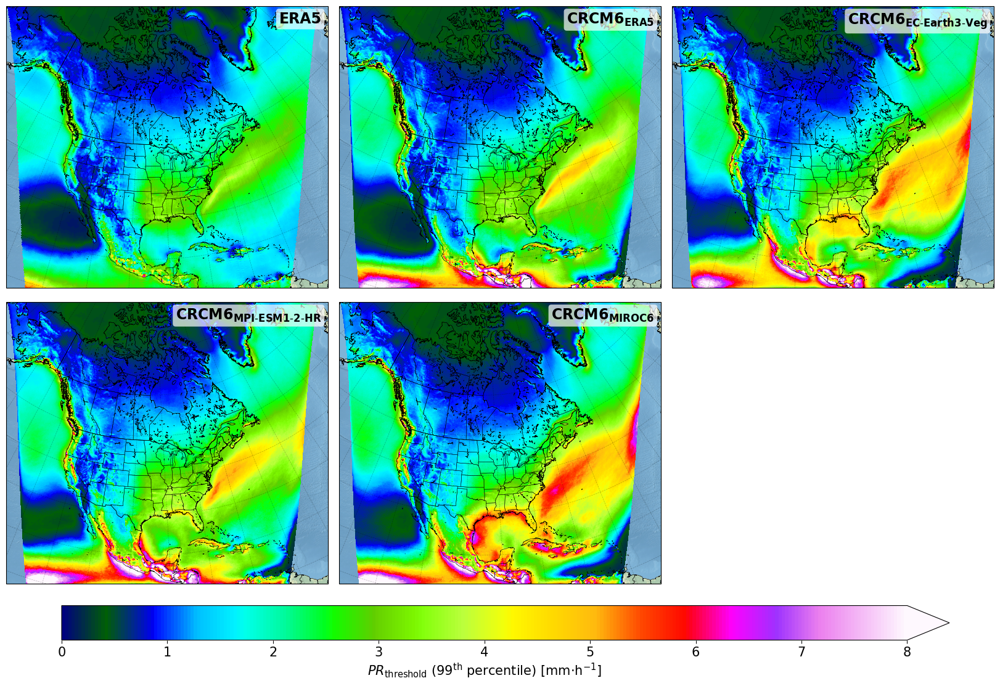

In [7]:
plotcrs = ccrs.LambertConformal(central_latitude=45, central_longitude=-95)
fig = plt.figure(figsize=(18, 16))

positions = [
    [0.05, 0.48, 0.29, 0.50],  # Rangée du haut, Colonne 1
    [0.35, 0.48, 0.29, 0.50],  # Rangée du haut, Colonne 2
    [0.65, 0.48, 0.29, 0.50],  # Rangée du haut, Colonne 3
    [0.05, 0.18, 0.29, 0.50],  # Rangée du bas, Colonne 1
    [0.35, 0.18, 0.29, 0.50],  # Rangée du bas, Colonne 2
    # [0.65, 0.11, 0.29, 0.50],  # Rangée du bas,  Colonne 3
]

vmin = 0
vmax = 8
cmap = plt.get_cmap('gist_ncar')

axes = [fig.add_axes(pos, projection=plotcrs) for pos in positions]

for i, (ax, sim) in enumerate(zip(axes, simulations[0:5])):
    
    if sim == 'ERA5':
        var_lat = 'latitude'
        var_lon = 'longitude'
        crs = ccrs.PlateCarree()
    else:
        var_lat = 'rlat'
        var_lon = 'rlon'
        crs = polecrs

    ax.set_extent([-130, -51, 77, 13], crs=ccrs.PlateCarree())
    borders = cartopy.feature.NaturalEarthFeature(category='cultural', name='admin_0_boundary_lines_land', scale='50m', facecolor='none')
    states_provinces = cartopy.feature.NaturalEarthFeature(category='cultural', name='admin_1_states_provinces', scale='50m', facecolor='none')
    lakes_color = cartopy.feature.NaturalEarthFeature(category='physical', name='lakes', scale='50m', facecolor='#7FB4D8', edgecolor='black')
    lakes_edge = cartopy.feature.NaturalEarthFeature(category='physical', name='lakes', scale='10m', facecolor='none', edgecolor='black')
    img = plt.imread('/home/vdemeyer/TOOLS/NE1_50M_SR_W.tif')
    ax.add_feature(borders, linewidth=0.5, edgecolor='black', zorder=2)
    ax.add_feature(states_provinces, edgecolor='black', linewidth=0.3)
    ax.add_feature(lakes_color, zorder=1, linewidth=0.3)
    ax.add_feature(lakes_edge, zorder=2, linewidth=0.3)
    ax.coastlines(resolution='10m', linewidth=0.4, color='black')
    ax.gridlines(linewidth=0.5, linestyle='--', color='k', alpha=0.25, xlocs=range(-180,180,10), ylocs=range(-90,90,10))
    ax.imshow(img, origin='upper', extent=(-180, 180, -90, 90), transform=ccrs.PlateCarree())

    sc = ax.pcolormesh(percentile[sim, 'pr'][var_lon], percentile[sim, 'pr'][var_lat],
                     percentile[sim, 'pr'].pr.sel(quantile=0.99), vmin=vmin, vmax=vmax, cmap=cmap, transform=crs)
    
    ax.text(0.98, 0.98, sim_label[sim], transform=ax.transAxes, fontsize=17, fontweight='bold',
            ha='right', va='top', bbox=dict(facecolor='white', alpha=0.7, edgecolor='none', boxstyle='round,pad=0.2'))
    
cbar_ax = fig.add_axes([0.1, 0.23, 0.8, 0.035])
cbar = fig.colorbar(sc, cax=cbar_ax, orientation="horizontal", pad=0.02, extend='max')
cbar.set_label(r'$PR_{\mathrm{threshold}}$ ($99^{\mathrm{th}}$ percentile) [mm·h$^{-1}$]', fontsize=15)
cbar.ax.tick_params(labelsize=15)

### Wind

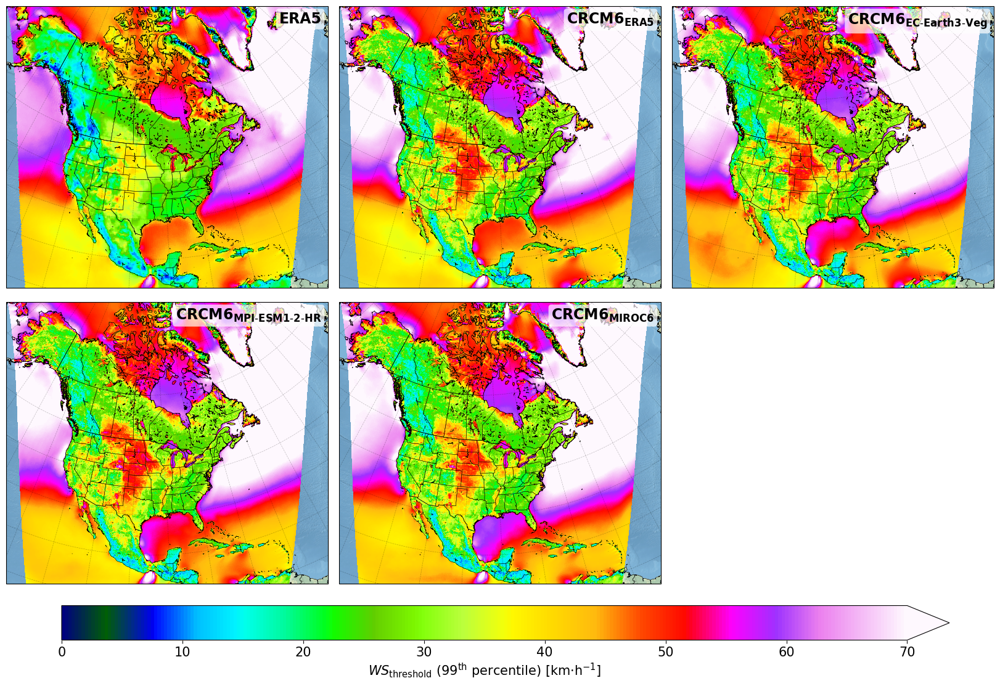

In [8]:
plotcrs = ccrs.LambertConformal(central_latitude=45, central_longitude=-95)
fig = plt.figure(figsize=(18, 16))

positions = [
    [0.05, 0.48, 0.29, 0.50],  # Rangée du haut, Colonne 1
    [0.35, 0.48, 0.29, 0.50],  # Rangée du haut, Colonne 2
    [0.65, 0.48, 0.29, 0.50],  # Rangée du haut, Colonne 3
    [0.05, 0.18, 0.29, 0.50],  # Rangée du bas, Colonne 1
    [0.35, 0.18, 0.29, 0.50],  # Rangée du bas, Colonne 2
    # [0.65, 0.11, 0.29, 0.50],  # Rangée du bas,  Colonne 3
]

vmin = 0
vmax = 70
cmap = plt.get_cmap('gist_ncar')

axes = [fig.add_axes(pos, projection=plotcrs) for pos in positions]

for i, (ax, sim) in enumerate(zip(axes, simulations[0:5])):
    
    if sim == 'ERA5':
        var_lat = 'latitude'
        var_lon = 'longitude'
        crs = ccrs.PlateCarree()
    else:
        var_lat = 'rlat'
        var_lon = 'rlon'
        crs = polecrs

    ax.set_extent([-130, -51, 77, 13], crs=ccrs.PlateCarree())
    borders = cartopy.feature.NaturalEarthFeature(category='cultural', name='admin_0_boundary_lines_land', scale='50m', facecolor='none')
    states_provinces = cartopy.feature.NaturalEarthFeature(category='cultural', name='admin_1_states_provinces', scale='50m', facecolor='none')
    lakes_color = cartopy.feature.NaturalEarthFeature(category='physical', name='lakes', scale='50m', facecolor='#7FB4D8', edgecolor='black')
    lakes_edge = cartopy.feature.NaturalEarthFeature(category='physical', name='lakes', scale='10m', facecolor='none', edgecolor='black')
    img = plt.imread('/home/vdemeyer/TOOLS/NE1_50M_SR_W.tif')
    ax.add_feature(borders, linewidth=0.5, edgecolor='black', zorder=2)
    ax.add_feature(states_provinces, edgecolor='black', linewidth=0.3)
    ax.add_feature(lakes_color, zorder=1, linewidth=0.3)
    ax.add_feature(lakes_edge, zorder=2, linewidth=0.3)
    ax.coastlines(resolution='10m', linewidth=0.4, color='black')
    ax.gridlines(linewidth=0.5, linestyle='--', color='k', alpha=0.25, xlocs=range(-180,180,10), ylocs=range(-90,90,10))
    ax.imshow(img, origin='upper', extent=(-180, 180, -90, 90), transform=ccrs.PlateCarree())

    sc = ax.pcolormesh(percentile[sim, 'ws'][var_lon], percentile[sim, 'ws'][var_lat],
                     percentile[sim, 'ws'].surf_wind.sel(quantile=0.99) * 3.6, vmin=vmin, vmax=vmax, cmap=cmap, transform=crs)
    
    ax.text(0.98, 0.98, sim_label[sim], transform=ax.transAxes, fontsize=17, fontweight='bold',
            ha='right', va='top', bbox=dict(facecolor='white', alpha=0.7, edgecolor='none', boxstyle='round,pad=0.2'))
    
cbar_ax = fig.add_axes([0.1, 0.23, 0.8, 0.035])
cbar = fig.colorbar(sc, cax=cbar_ax, orientation="horizontal", pad=0.02, extend='max')
cbar.set_label(r'$WS_{\mathrm{threshold}}$ ($99^{\mathrm{th}}$ percentile) [km·h$^{-1}$]', fontsize=15)
cbar.ax.tick_params(labelsize=15)

## Historical wet-day percentile

In [58]:
start_year, end_year = 1980, 2014
percentile = {}

for sim in simulations[0:5]:
    percentile_path = f'/home/vdemeyer/projects/rrg-gachon/vdemeyer/{sim}/PR_Percentile/pr_{sim.lower()}_percentile_{start_year}-{end_year}_wetdays.nc'
    percentile[sim] = xr.open_dataset(percentile_path)

### Precipitation

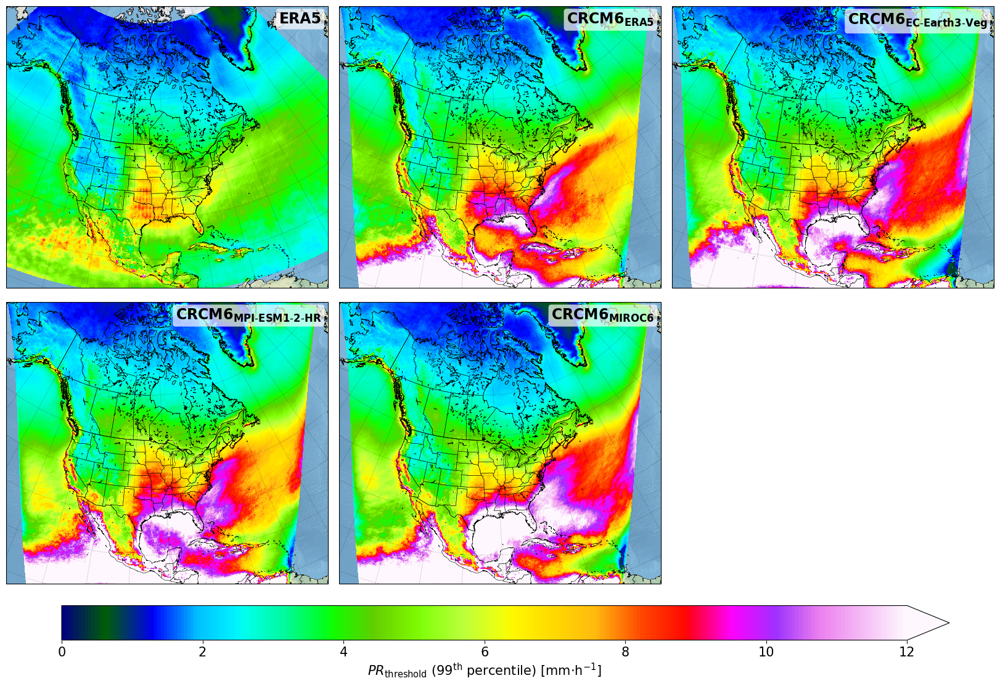

In [59]:
plotcrs = ccrs.LambertConformal(central_latitude=45, central_longitude=-95)
fig = plt.figure(figsize=(18, 16))

positions = [
    [0.05, 0.48, 0.29, 0.50],  # Rangée du haut, Colonne 1
    [0.35, 0.48, 0.29, 0.50],  # Rangée du haut, Colonne 2
    [0.65, 0.48, 0.29, 0.50],  # Rangée du haut, Colonne 3
    [0.05, 0.18, 0.29, 0.50],  # Rangée du bas, Colonne 1
    [0.35, 0.18, 0.29, 0.50],  # Rangée du bas, Colonne 2
    # [0.65, 0.11, 0.29, 0.50],  # Rangée du bas,  Colonne 3
]

vmin = 0
vmax = 12
cmap = plt.get_cmap('gist_ncar')

axes = [fig.add_axes(pos, projection=plotcrs) for pos in positions]

for i, (ax, sim) in enumerate(zip(axes, simulations[0:5])):
    
    if sim == 'ERA5':
        var_lat = 'latitude'
        var_lon = 'longitude'
        crs = ccrs.PlateCarree()
    else:
        var_lat = 'rlat'
        var_lon = 'rlon'
        crs = polecrs

    ax.set_extent([-130, -51, 77, 13], crs=ccrs.PlateCarree())
    borders = cartopy.feature.NaturalEarthFeature(category='cultural', name='admin_0_boundary_lines_land', scale='50m', facecolor='none')
    states_provinces = cartopy.feature.NaturalEarthFeature(category='cultural', name='admin_1_states_provinces', scale='50m', facecolor='none')
    lakes_color = cartopy.feature.NaturalEarthFeature(category='physical', name='lakes', scale='50m', facecolor='#7FB4D8', edgecolor='black')
    lakes_edge = cartopy.feature.NaturalEarthFeature(category='physical', name='lakes', scale='10m', facecolor='none', edgecolor='black')
    img = plt.imread('/home/vdemeyer/TOOLS/NE1_50M_SR_W.tif')
    ax.add_feature(borders, linewidth=0.5, edgecolor='black', zorder=2)
    ax.add_feature(states_provinces, edgecolor='black', linewidth=0.3)
    ax.add_feature(lakes_color, zorder=1, linewidth=0.3)
    ax.add_feature(lakes_edge, zorder=2, linewidth=0.3)
    ax.coastlines(resolution='10m', linewidth=0.4, color='black')
    ax.gridlines(linewidth=0.5, linestyle='--', color='k', alpha=0.25, xlocs=range(-180,180,10), ylocs=range(-90,90,10))
    ax.imshow(img, origin='upper', extent=(-180, 180, -90, 90), transform=ccrs.PlateCarree())

    sc = ax.pcolormesh(percentile[sim][var_lon], percentile[sim][var_lat],
                     percentile[sim].pr.sel(quantile=0.99), vmin=vmin, vmax=vmax, cmap=cmap, transform=crs)
    
    ax.text(0.98, 0.98, sim_label[sim], transform=ax.transAxes, fontsize=17, fontweight='bold',
            ha='right', va='top', bbox=dict(facecolor='white', alpha=0.7, edgecolor='none', boxstyle='round,pad=0.2'))
    
cbar_ax = fig.add_axes([0.1, 0.23, 0.8, 0.035])
cbar = fig.colorbar(sc, cax=cbar_ax, orientation="horizontal", pad=0.02, extend='max')
cbar.set_label(r'$PR_{\mathrm{threshold}}$ ($99^{\mathrm{th}}$ percentile) [mm·h$^{-1}$]', fontsize=15)
cbar.ax.tick_params(labelsize=15)

## Future all-day percentile

In [62]:
for sim in simulations[5:]:
    if sim == 'UBI':
        start_year, end_year = 2063, 2097
    else:
        start_year, end_year = 2066, 2100
        
    for var in ['pr', 'ws']:
        if var == 'pr':
            percentile_path = f'/home/vdemeyer/projects/rrg-gachon/vdemeyer/{sim}/PR_Percentile/pr_{sim.lower()}_percentile_{start_year}-{end_year}.nc'
        else:
            percentile_path = f'/home/vdemeyer/projects/rrg-gachon/vdemeyer/{sim}/WIND_Percentile/surf_wind_{sim.lower()}_percentile_{start_year}-{end_year}.nc'

        percentile[(sim, var)] = xr.open_dataset(percentile_path)

### Precipitation

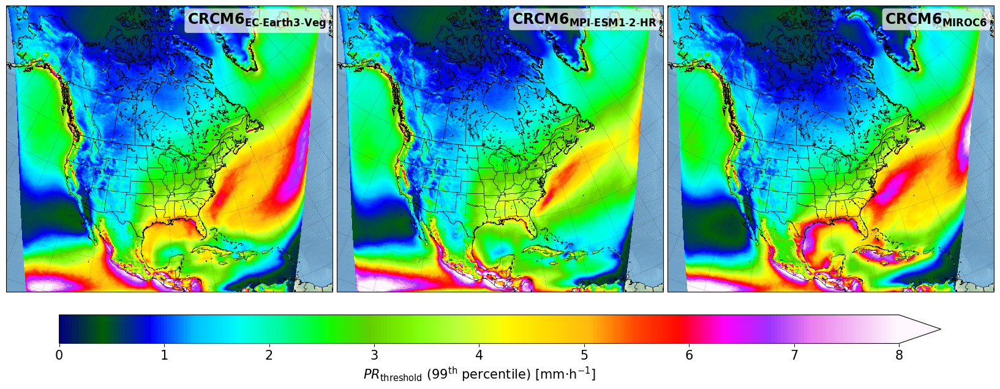

In [65]:
plotcrs = ccrs.LambertConformal(central_latitude=45, central_longitude=-95)
fig = plt.figure(figsize=(18, 8.5))

positions = [
    [0.05, 0.30, 0.40, 0.55],  # Rangée du haut, Colonne 1
    [0.35, 0.30, 0.40, 0.55],  # Rangée du haut, Colonne 2
    [0.65, 0.30, 0.40, 0.55],  # Rangée du haut, Colonne 3
]

vmin = 0
vmax = 8
cmap = plt.get_cmap('gist_ncar')

axes = [fig.add_axes(pos, projection=plotcrs) for pos in positions]

for i, (ax, sim) in enumerate(zip(axes, simulations[5:])):
    
    if sim == 'ERA5':
        var_lat = 'latitude'
        var_lon = 'longitude'
        crs = ccrs.PlateCarree()
    else:
        var_lat = 'rlat'
        var_lon = 'rlon'
        crs = polecrs

    ax.set_extent([-130, -51, 77, 13], crs=ccrs.PlateCarree())
    borders = cartopy.feature.NaturalEarthFeature(category='cultural', name='admin_0_boundary_lines_land', scale='50m', facecolor='none')
    states_provinces = cartopy.feature.NaturalEarthFeature(category='cultural', name='admin_1_states_provinces', scale='50m', facecolor='none')
    lakes_color = cartopy.feature.NaturalEarthFeature(category='physical', name='lakes', scale='50m', facecolor='#7FB4D8', edgecolor='black')
    lakes_edge = cartopy.feature.NaturalEarthFeature(category='physical', name='lakes', scale='10m', facecolor='none', edgecolor='black')
    img = plt.imread('/home/vdemeyer/TOOLS/NE1_50M_SR_W.tif')
    ax.add_feature(borders, linewidth=0.5, edgecolor='black', zorder=2)
    ax.add_feature(states_provinces, edgecolor='black', linewidth=0.3)
    ax.add_feature(lakes_color, zorder=1, linewidth=0.3)
    ax.add_feature(lakes_edge, zorder=2, linewidth=0.3)
    ax.coastlines(resolution='10m', linewidth=0.4, color='black')
    ax.gridlines(linewidth=0.5, linestyle='--', color='k', alpha=0.25, xlocs=range(-180,180,10), ylocs=range(-90,90,10))
    ax.imshow(img, origin='upper', extent=(-180, 180, -90, 90), transform=ccrs.PlateCarree())

    sc = ax.pcolormesh(percentile[sim, 'pr'][var_lon], percentile[sim, 'pr'][var_lat],
                     percentile[sim, 'pr'].pr.sel(quantile=0.99), vmin=vmin, vmax=vmax, cmap=cmap, transform=crs)
    
    ax.text(0.98, 0.98, sim_label[sim], transform=ax.transAxes, fontsize=17, fontweight='bold',
            ha='right', va='top', bbox=dict(facecolor='white', alpha=0.7, edgecolor='none', boxstyle='round,pad=0.2'))
    
cbar_ax = fig.add_axes([0.15, 0.2, 0.8, 0.058])  # [left, bottom, width, height]
cbar = fig.colorbar(sc, cax=cbar_ax, orientation="horizontal", pad=0.02, extend='max')
cbar.set_label(r'$PR_{\mathrm{threshold}}$ ($99^{\mathrm{th}}$ percentile) [mm·h$^{-1}$]', fontsize=15)
cbar.ax.tick_params(labelsize=15)

### Wind

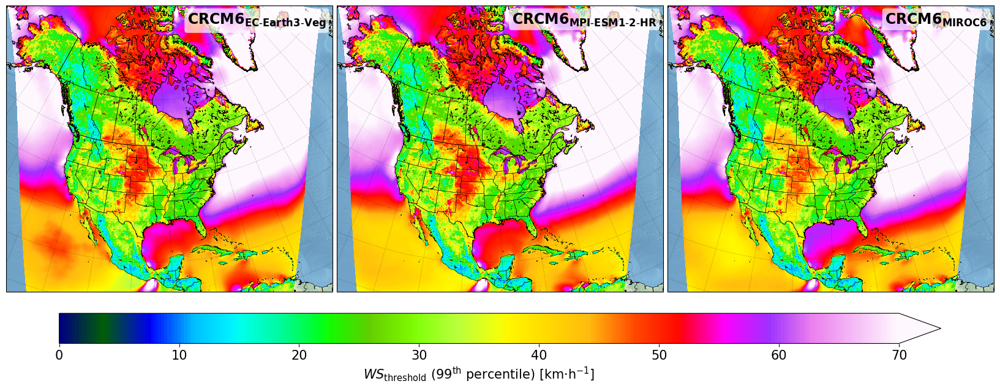

In [66]:
plotcrs = ccrs.LambertConformal(central_latitude=45, central_longitude=-95)
fig = plt.figure(figsize=(18, 8.5))

positions = [
    [0.05, 0.30, 0.40, 0.55],  # Rangée du haut, Colonne 1
    [0.35, 0.30, 0.40, 0.55],  # Rangée du haut, Colonne 2
    [0.65, 0.30, 0.40, 0.55],  # Rangée du haut, Colonne 3
]

vmin = 0
vmax = 70
cmap = plt.get_cmap('gist_ncar')

axes = [fig.add_axes(pos, projection=plotcrs) for pos in positions]

for i, (ax, sim) in enumerate(zip(axes, simulations[5:])):
    
    if sim == 'ERA5':
        var_lat = 'latitude'
        var_lon = 'longitude'
        crs = ccrs.PlateCarree()
    else:
        var_lat = 'rlat'
        var_lon = 'rlon'
        crs = polecrs

    ax.set_extent([-130, -51, 77, 13], crs=ccrs.PlateCarree())
    borders = cartopy.feature.NaturalEarthFeature(category='cultural', name='admin_0_boundary_lines_land', scale='50m', facecolor='none')
    states_provinces = cartopy.feature.NaturalEarthFeature(category='cultural', name='admin_1_states_provinces', scale='50m', facecolor='none')
    lakes_color = cartopy.feature.NaturalEarthFeature(category='physical', name='lakes', scale='50m', facecolor='#7FB4D8', edgecolor='black')
    lakes_edge = cartopy.feature.NaturalEarthFeature(category='physical', name='lakes', scale='10m', facecolor='none', edgecolor='black')
    img = plt.imread('/home/vdemeyer/TOOLS/NE1_50M_SR_W.tif')
    ax.add_feature(borders, linewidth=0.5, edgecolor='black', zorder=2)
    ax.add_feature(states_provinces, edgecolor='black', linewidth=0.3)
    ax.add_feature(lakes_color, zorder=1, linewidth=0.3)
    ax.add_feature(lakes_edge, zorder=2, linewidth=0.3)
    ax.coastlines(resolution='10m', linewidth=0.4, color='black')
    ax.gridlines(linewidth=0.5, linestyle='--', color='k', alpha=0.25, xlocs=range(-180,180,10), ylocs=range(-90,90,10))
    ax.imshow(img, origin='upper', extent=(-180, 180, -90, 90), transform=ccrs.PlateCarree())

    sc = ax.pcolormesh(percentile[sim, 'ws'][var_lon], percentile[sim, 'ws'][var_lat],
                     percentile[sim, 'ws'].surf_wind.sel(quantile=0.99) * 3.6, vmin=vmin, vmax=vmax, cmap=cmap, transform=crs)
    
    ax.text(0.98, 0.98, sim_label[sim], transform=ax.transAxes, fontsize=17, fontweight='bold',
            ha='right', va='top', bbox=dict(facecolor='white', alpha=0.7, edgecolor='none', boxstyle='round,pad=0.2'))
    
cbar_ax = fig.add_axes([0.15, 0.2, 0.8, 0.058])  # [left, bottom, width, height]
cbar = fig.colorbar(sc, cax=cbar_ax, orientation="horizontal", pad=0.02, extend='max')
cbar.set_label(r'$WS_{\mathrm{threshold}}$ ($99^{\mathrm{th}}$ percentile) [km·h$^{-1}$]', fontsize=15)
cbar.ax.tick_params(labelsize=15)